In [1]:
!pip install --quiet albumentations pytorch-lightning

     |████████████████████████████████| 796 kB 13.4 MB/s 
     |████████████████████████████████| 136 kB 70.0 MB/s 
     |████████████████████████████████| 529 kB 68.1 MB/s 
     |████████████████████████████████| 87 kB 7.6 MB/s 


In [2]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image

import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader

import cv2
import albumentations as A
from skimage.io import imread

import pytorch_lightning as pl
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint

## Raw data explore

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!cp drive/MyDrive/public_tests.zip tests.zip

In [5]:
!unzip -q tests.zip -d tests

In [6]:
!ls tests/00_test_img_input/train

gt.csv	images


In [7]:
def read_csv(filename):
    res = {}
    with open(filename) as fhandle:
        next(fhandle)
        for line in fhandle:
            parts = line.rstrip('\n').split(',')
            coords = np.array([float(x) for x in parts[1:]], dtype='float64')
            res[parts[0]] = coords
    return res

In [8]:
gt = read_csv('tests/00_test_img_input/train/gt.csv')
print(len(gt), 'train size')

6000 train size


In [12]:
print(gt['00000.jpg'])

[ 51.  51. 127.  60. 169.  65. 203.  52.  68.  77.  85.  75. 110.  82.
 160.  87. 171.  79. 193.  84. 156. 144.  92. 174. 140. 180. 168. 179.]


Shape (262, 262, 3)


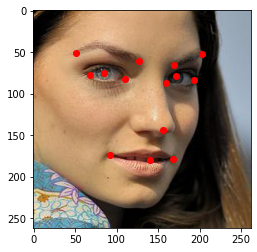

Shape (355, 355, 3)


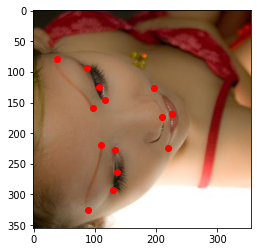

In [13]:
img = cv2.imread('tests/00_test_img_input/train/images/00000.jpg')[..., ::-1]
print('Shape', img.shape)

plt.imshow(img)
xx, yy = gt['00000.jpg'][::2], gt['00000.jpg'][1::2]
plt.scatter(x=xx, y=yy, c='r')
plt.show()

img = cv2.imread('tests/00_test_img_input/train/images/00010.jpg')[..., ::-1]
print('Shape', img.shape)

plt.imshow(img)
xx, yy = gt['00010.jpg'][::2], gt['00010.jpg'][1::2]
plt.scatter(x=xx, y=yy, c='r')
plt.show()

In [ ]:
def print_imgs_info(path):
    files = sorted(os.listdir(path))
    shapes = [cv2.imread(f'{path}{p}').shape for p in files]
    sizes = [s[0] for s in shapes]
    channels = [s[2] for s in shapes]

    print('Sizes (min/mean/max):', min(sizes), int(np.mean(sizes)), max(sizes))
    print('Channels:', Counter(channels))

In [ ]:
print_imgs_info('tests/00_test_img_input/train/images/')

Sizes (min/mean/max): 34 284 4340
Channels: Counter({3: 6000})


In [ ]:
print_imgs_info('tests/00_test_img_input/test/images/')

Sizes (min/mean/max): 34 284 4340
Channels: Counter({3: 6000})


* train/test are the same in this task

## Dataset

In [13]:
class FacepointsDataset(Dataset):
    def __init__(self, 
                 mode: str, 
                 gt: dict,
                 img_dir: str,
                 fraction: float = 0.8, 
                 transform = None,
                ):
        self._items = []
        self._transform = transform

        imgs = sorted(os.listdir(img_dir))
        split = int(fraction * len(imgs))
        
        if mode == 'train':
            img_names = imgs[:split]
        elif mode == 'val':
            img_names = imgs[split:]
        else:
            raise ValueError(f'Wrong mode = {mode}!')

        for img in img_names:
            self._items.append((os.path.join(img_dir, img), gt[img]))

    def __len__(self):
        return len(self._items)

    def __getitem__(self, index):
        img_path, facepoints = self._items[index]
        facepoints = np.array(facepoints).astype(np.float32)

        image = imread(img_path)
        image = np.array(image).astype(np.float32)
        x, y = image.shape[1], image.shape[0]

        # resizing
        size = 100
        image = cv2.resize(image, (size,size))
        facepoints[::2] = facepoints[::2] * (size / x)
        facepoints[1::2] = facepoints[1::2] * (size / y)

        # single channel image
        if len(image.shape) == 2:
            image = np.stack([image]*3).transpose(1, 2, 0)

        # augmentation
        if self._transform:
            keypoints = list(zip(facepoints[::2], facepoints[1::2]))
            transformed = self._transform(image=image, keypoints=keypoints)
            image = transformed['image']
            facepoints = np.ravel(transformed['keypoints']).astype(np.float32)

        image = torch.from_numpy(image.transpose(2, 0, 1))
        facepoints = torch.from_numpy(facepoints)

        # normalization
        mean = image.mean([1,2]).reshape(3,1,1)
        std = image.std([1,2]).reshape(3,1,1)
        image = (image - mean) / std

        return image, facepoints

## Model

In [14]:
class FaceModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        """Define computations here"""
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv6 = nn.Conv2d(128, 128, 3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(32)
        self.batchnorm2 = nn.BatchNorm2d(32)
        self.batchnorm3 = nn.BatchNorm2d(64)
        self.batchnorm4 = nn.BatchNorm2d(64)
        self.batchnorm5 = nn.BatchNorm2d(128)
        self.batchnorm6 = nn.BatchNorm2d(128)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(128*12*12, 128)
        self.fc2 = nn.Linear(128, 28)
    
    def forward(self, x):
        """ Use for inference only (separate from training_step)"""
        x = self.batchnorm1(self.relu(self.conv1(x)))
        x = self.pool(self.batchnorm2(self.relu(self.conv2(x))))
        x = self.batchnorm3(self.relu(self.conv3(x)))
        x = self.pool(self.batchnorm4(self.relu(self.conv4(x))))
        x = self.batchnorm5(self.relu(self.conv5(x)))
        x = self.pool(self.batchnorm6(self.relu(self.conv6(x))))
        x = torch.flatten(x, 1)
        x = self.dropout(self.relu(self.fc1(x)))
        x = self.fc2(x)
        return x
    
    def training_step(self, batch, batch_idx):
        """The full training loop"""
        x, y = batch
        loss = F.mse_loss(self(x), y)
        return {'loss': loss}
    
    def configure_optimizers(self):
        """Define optimizers and LR schedulers"""
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3, weight_decay=5e-4)
        lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 
                                                                  mode='min', 
                                                                  factor=0.2, 
                                                                  patience=3, 
                                                                  verbose=True)
        lr_dict = {
            "scheduler": lr_scheduler,
            "interval": "epoch",
            "frequency": 1,
            "monitor": "val_loss"
        } 
        return [optimizer], [lr_dict]
    
    def validation_step(self, batch, batch_idx):
        """The full validation loop"""
        x, y = batch
        loss = F.mse_loss(self(x), y)
        return {'val_loss': loss}

    def training_epoch_end(self, outputs):
        """Log and display average train loss across epoch"""
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
        print(f"| Train_loss: {avg_loss:.2f}" )
        self.log('train_loss', avg_loss, prog_bar=True, on_epoch=True, on_step=False)
     
    def validation_epoch_end(self, outputs):
        """Log and display average val loss"""
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        print(f"[Epoch {self.trainer.current_epoch:3}] Val_loss: {avg_loss:.2f}", end= " ")
        self.log('val_loss', avg_loss, prog_bar=True, on_epoch=True, on_step=False)

### Training

In [15]:
def train_detector(train_gt: dict, 
                   train_img_dir: str,
                   fast_train=True):
    '''Train model on train (with fast_train <5 min)'''
    MyTransform = A.Compose([
        A.Rotate(limit=70, p=0.3),
    ], keypoint_params=A.KeypointParams(format='xy', remove_invisible=False))

    ds_train = FacepointsDataset(mode="train", gt=train_gt, img_dir=train_img_dir, transform=MyTransform)
    ds_val = FacepointsDataset(mode="val", gt=train_gt, img_dir=train_img_dir)

    dl_train = DataLoader(ds_train, batch_size=32, shuffle=True, num_workers=2)
    dl_val = DataLoader(ds_val, batch_size=16, shuffle=False, num_workers=2)

    model = FaceModel()

    if fast_train:
        trainer = pl.Trainer(max_epochs=1,
                             accelerator='cpu', 
                             devices=1,
                             logger=False,
                             enable_checkpointing=False)
        trainer.fit(model, dl_train, dl_val)
    else:
        checkpoint = ModelCheckpoint(dirpath='pl_model',
                                     filename='{epoch}-{val_loss:.3f}',
                                     monitor='val_loss',
                                     mode='min',
                                     save_top_k=1)
        earlystopping = EarlyStopping(monitor="val_loss",
                                      mode="min",
                                      patience=8,
                                      verbose=True)
        trainer = pl.Trainer(max_epochs=50,
                             accelerator='gpu', 
                             devices=1,
                             logger=True,
                             enable_checkpointing=True,
                             callbacks=[checkpoint, earlystopping])
        trainer.fit(model, dl_train, dl_val)
        torch.save(model.to('cpu').state_dict(), "facepoints_model.ckpt")

    return model

In [ ]:
# testing fast_train
model = train_detector(train_gt=gt, 
                       train_img_dir='tests/00_test_img_input/train/images',
                       fast_train=True)

In [16]:
# train model for a best fit
model = train_detector(train_gt=gt, 
                       train_img_dir='tests/00_test_img_input/train/images',
                       fast_train=False)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name       | Type        | Params
--------------------------------------------
0  | conv1      | Conv2d      | 896   
1  | conv2      | Conv2d      | 9.2 K 
2  | conv3      | Conv2d      | 18.5 K
3  | conv4      | Conv2d      | 36.9 K
4  | conv5      | Conv2d      | 73.9 K
5  | conv6      | Conv2d      | 147 K 
6  | batchnorm1 | BatchNorm2d | 64    
7  | batchnorm2 | BatchNorm2d | 64    
8  | batchnorm3 | BatchNorm2d | 128   
9  | batchnorm4 | BatchNorm2d | 128   
10 | batchnorm5 | BatchNorm2d | 256   
11 | batchnorm6 | BatchNorm2d | 

Sanity Checking: 0it [00:00, ?it/s]

[Epoch   0] Val_loss: 2351.91 

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[Epoch   0] Val_loss: 22.51 

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 22.512


| Train_loss: 132.45


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.770 >= min_delta = 0.0. New best score: 21.742


[Epoch   1] Val_loss: 21.74 | Train_loss: 53.80


Validation: 0it [00:00, ?it/s]

[Epoch   2] Val_loss: 25.84 | Train_loss: 45.45


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.897 >= min_delta = 0.0. New best score: 18.845


[Epoch   3] Val_loss: 18.84 | Train_loss: 41.58


Validation: 0it [00:00, ?it/s]

[Epoch   4] Val_loss: 20.86 | Train_loss: 36.79


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.748 >= min_delta = 0.0. New best score: 12.097


[Epoch   5] Val_loss: 12.10 | Train_loss: 30.74


Validation: 0it [00:00, ?it/s]

[Epoch   6] Val_loss: 12.57 | Train_loss: 27.14


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.930 >= min_delta = 0.0. New best score: 11.167


[Epoch   7] Val_loss: 11.17 | Train_loss: 26.78


Validation: 0it [00:00, ?it/s]

[Epoch   8] Val_loss: 11.67 | Train_loss: 24.58


Validation: 0it [00:00, ?it/s]

[Epoch   9] Val_loss: 18.12 | Train_loss: 22.97


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.524 >= min_delta = 0.0. New best score: 10.643


[Epoch  10] Val_loss: 10.64 | Train_loss: 22.81


Validation: 0it [00:00, ?it/s]

[Epoch  11] Val_loss: 11.25 | Train_loss: 22.50


Validation: 0it [00:00, ?it/s]

[Epoch  12] Val_loss: 11.27 | Train_loss: 22.17


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.376 >= min_delta = 0.0. New best score: 10.267


[Epoch  13] Val_loss: 10.27 | Train_loss: 22.22


Validation: 0it [00:00, ?it/s]

[Epoch  14] Val_loss: 10.44 | Train_loss: 20.82


Validation: 0it [00:00, ?it/s]

[Epoch  15] Val_loss: 15.88 | Train_loss: 20.32


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.972 >= min_delta = 0.0. New best score: 9.295


[Epoch  16] Val_loss: 9.30 | Train_loss: 21.14


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.264 >= min_delta = 0.0. New best score: 9.031


[Epoch  17] Val_loss: 9.03 | Train_loss: 20.61


Validation: 0it [00:00, ?it/s]

[Epoch  18] Val_loss: 15.03 | Train_loss: 19.94


Validation: 0it [00:00, ?it/s]

[Epoch  19] Val_loss: 9.12 | Train_loss: 19.46


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.529 >= min_delta = 0.0. New best score: 8.502


[Epoch  20] Val_loss: 8.50 | Train_loss: 19.13


Validation: 0it [00:00, ?it/s]

[Epoch  21] Val_loss: 8.94 | Train_loss: 19.44


Validation: 0it [00:00, ?it/s]

[Epoch  22] Val_loss: 9.99 | Train_loss: 19.88


Validation: 0it [00:00, ?it/s]

[Epoch  23] Val_loss: 8.95 | Train_loss: 18.95


Validation: 0it [00:00, ?it/s]

[Epoch  24] Val_loss: 10.19 | Train_loss: 19.41
Epoch 00025: reducing learning rate of group 0 to 2.0000e-04.


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.903 >= min_delta = 0.0. New best score: 7.599


[Epoch  25] Val_loss: 7.60 | Train_loss: 17.03


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.497 >= min_delta = 0.0. New best score: 7.102


[Epoch  26] Val_loss: 7.10 | Train_loss: 15.90


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.212 >= min_delta = 0.0. New best score: 6.890


[Epoch  27] Val_loss: 6.89 | Train_loss: 15.25


Validation: 0it [00:00, ?it/s]

[Epoch  28] Val_loss: 7.12 | Train_loss: 15.03


Validation: 0it [00:00, ?it/s]

[Epoch  29] Val_loss: 8.25 | Train_loss: 14.96


Validation: 0it [00:00, ?it/s]

[Epoch  30] Val_loss: 7.83 | Train_loss: 15.05


Validation: 0it [00:00, ?it/s]

[Epoch  31] Val_loss: 7.99 | Train_loss: 16.04
Epoch 00032: reducing learning rate of group 0 to 4.0000e-05.


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.149 >= min_delta = 0.0. New best score: 6.741


[Epoch  32] Val_loss: 6.74 | Train_loss: 14.74


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.096 >= min_delta = 0.0. New best score: 6.645


[Epoch  33] Val_loss: 6.64 | Train_loss: 14.71


Validation: 0it [00:00, ?it/s]

[Epoch  34] Val_loss: 6.80 | Train_loss: 14.73


Validation: 0it [00:00, ?it/s]

[Epoch  35] Val_loss: 6.96 | Train_loss: 15.05


Validation: 0it [00:00, ?it/s]

[Epoch  36] Val_loss: 6.79 | Train_loss: 14.74


Validation: 0it [00:00, ?it/s]

[Epoch  37] Val_loss: 6.88 | Train_loss: 14.69
Epoch 00038: reducing learning rate of group 0 to 8.0000e-06.


Validation: 0it [00:00, ?it/s]

[Epoch  38] Val_loss: 6.83 | Train_loss: 14.49


Validation: 0it [00:00, ?it/s]

[Epoch  39] Val_loss: 6.82 | Train_loss: 14.25


Validation: 0it [00:00, ?it/s]

[Epoch  40] Val_loss: 6.80 | Train_loss: 14.61


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 8 records. Best score: 6.645. Signaling Trainer to stop.


[Epoch  41] Val_loss: 6.77 | Train_loss: 14.37
Epoch 00042: reducing learning rate of group 0 to 1.6000e-06.


### Save/load model

In [ ]:
# torch.save(model.to('cpu').state_dict(), "facepoints_model.ckpt")

In [22]:
!ls pl_model/

'epoch=33-val_loss=6.645.ckpt'


In [ ]:
# load trained model from checkpoint (besides weights, the other info is also there)

model.load_state_dict(torch.load("pl_model/epoch=33-val_loss=6.645.ckpt")['state_dict'])

In [ ]:
torch.save(model.state_dict(), "facepoints_model.ckpt")

### Predictions

In [17]:
def detect(model_filename: str, 
           test_img_dir: str):
    '''
    Returns dict with predictions sized N: 
        {image_1: [x_1, y_1, ..., x_14, y_14], 
         image_2: ...}
    '''
    model = FaceModel()
    model.load_state_dict(torch.load(model_filename))
    model.eval()
    imgs_names = sorted(os.listdir(test_img_dir))
    predictions = {}

    # batch size = 1
    for img_name in imgs_names:
        img_path = os.path.join(test_img_dir, img_name)
        image = imread(img_path)
        image = np.array(image).astype(np.float32)
        x, y = image.shape[1], image.shape[0]

        # resizing
        size = 100
        image = cv2.resize(image, (size,size))
        
        # single channel image
        if len(image.shape) == 2:
            image = np.stack([image]*3).transpose(1, 2, 0)
        
        # normalization
        image = torch.from_numpy(image.transpose(2, 0, 1))
        mean = image.mean([1,2]).reshape(3,1,1)
        std = image.std([1,2]).reshape(3,1,1)
        image = (image - mean) / std
        
        # prediction
        image = image.unsqueeze(0)
        pred = model(image).detach().numpy()[0]
        pred[::2] = pred[::2] * (x / size)
        pred[1::2] = pred[1::2] * (y / size)
        predictions.update({img_name: pred})

    return predictions

In [18]:
%%time
preds = detect(model_filename='facepoints_model.ckpt',
               test_img_dir='tests/00_test_img_input/test/images')

CPU times: user 1min 57s, sys: 4.62 s, total: 2min 2s
Wall time: 2min


### Result

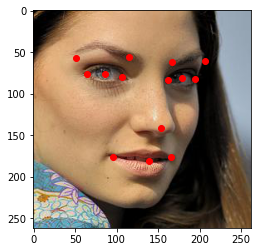

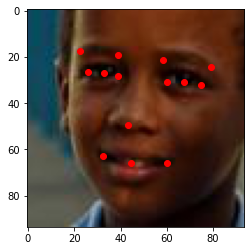

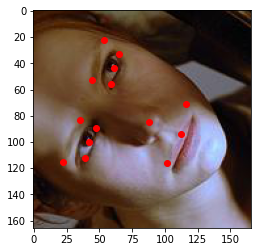

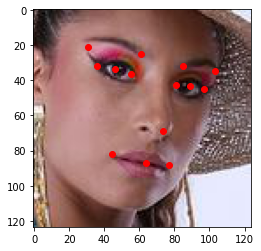

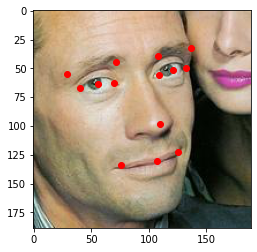

...

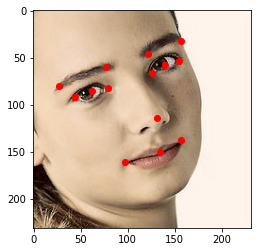

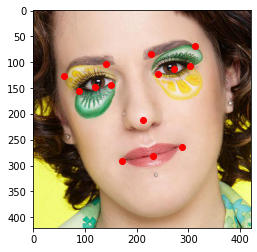

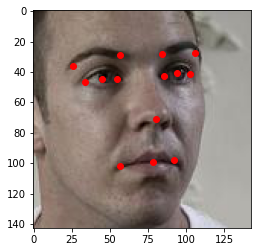

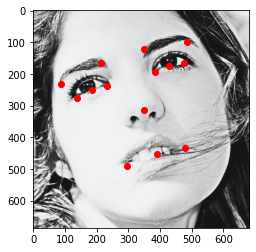

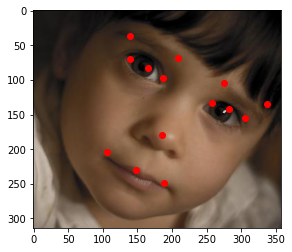

In [19]:
for i, (name, points) in enumerate(preds.items()):
    plt.imshow(Image.open(f'tests/00_test_img_input/test/images/{name}').convert('RGB'))
    xx, yy = points[::2], points[1::2]
    plt.scatter(x=xx, y=yy, c='r')
    plt.show()
    # time.sleep(2)
    if i == 20:
        break

---

In [20]:
%load_ext tensorboard

In [21]:
%tensorboard --logdir lightning_logs

Output hidden; open in https://colab.research.google.com to view.